In [1]:
import numpy as np

In [9]:
import matplotlib.pyplot as plt

In [12]:
from scipy.misc import electrocardiogram
from scipy.signal import find_peaks
#perform convertion
def createg(peaks,data):
    sampnum = 100
    fin = np.zeros((len(peaks)-2,sampnum))
    for i in range(len(peaks)-2):
        tempd = data[peaks[i]:peaks[i+1]+1]
        tinterp = np.interp(np.arange(sampnum)*len(tempd)/sampnum, np.arange(len(tempd)), tempd)
        tinterp = tinterp - np.arange(sampnum)*(tinterp[-1]-tinterp[0])/(sampnum-1)
        tinterp = tinterp - tinterp[0]
        tinterp = tinterp/tinterp.mean()
        fin[i,:] = tinterp
    return fin
def tosignature(dat):
    peaks, _ = find_peaks(-dat, height=0,distance=50)
    '''fig = go.Figure()
    fig.add_trace(go.Scatter(y=dat))
    fig.add_trace(go.Scatter(x=peaks,y=dat[peaks],mode="markers"))
    fig.show()'''
    return peaks
def outlierremove(dat):
    a = np.ma.array(dat, mask=False)
    for i in range(len(dat)):
        a.mask[i] = True
        if notlikelihood(dat[i],dat)<2:
            a.mask[i] = False
    return a.compressed().reshape(-1,100)
def notlikelihood(dat,arr):
    divg = np.abs(dat[1:-1] - arr[:,1:-1].mean(axis = 0))/arr[:,1:-1].std(axis = 0)
    score = np.sum(divg)/98
    return score
def iteroutlierremove(dat):
    numd = len(dat)
    res = outlierremove(dat)
    while len(res) < numd:
        numd = len(res)
        res = outlierremove(res)
    return res
def similarperson(x,target):
    temp = []
    for tr in x:
        temp.append(notlikelihood(tr,target))
    return temp

In [2]:
tat = np.load('tatrfacemesh5ch90.npy',allow_pickle=True)

In [3]:
k = tat.item()

In [4]:
k.keys()

dict_keys(['s19_trial01.avi.npy', 's19_trial02.avi.npy', 's19_trial03.avi.npy', 's19_trial04.avi.npy', 's19_trial05.avi.npy', 's19_trial06.avi.npy', 's19_trial07.avi.npy', 's19_trial08.avi.npy', 's19_trial09.avi.npy', 's19_trial10.avi.npy', 's19_trial11.avi.npy', 's19_trial12.avi.npy', 's19_trial13.avi.npy', 's19_trial14.avi.npy', 's19_trial15.avi.npy', 's19_trial16.avi.npy', 's19_trial17.avi.npy', 's19_trial18.avi.npy', 's19_trial19.avi.npy', 's19_trial20.avi.npy', 's19_trial21.avi.npy', 's19_trial22.avi.npy', 's19_trial23.avi.npy', 's19_trial24.avi.npy', 's19_trial25.avi.npy', 's19_trial26.avi.npy', 's19_trial27.avi.npy', 's19_trial28.avi.npy', 's19_trial29.avi.npy', 's19_trial30.avi.npy', 's19_trial31.avi.npy', 's19_trial32.avi.npy', 's19_trial33.avi.npy', 's19_trial34.avi.npy', 's19_trial35.avi.npy', 's19_trial36.avi.npy', 's19_trial37.avi.npy', 's19_trial38.avi.npy', 's19_trial39.avi.npy', 's19_trial40.avi.npy', 's20_trial01.avi.npy', 's20_trial02.avi.npy', 's20_trial03.avi.npy', 

In [5]:
 len(k.keys())

160

In [6]:
def retrivep(x,target,maxdist):
    temp = []
    for p in x.T:
        if notlikelihood(p,target) < maxdist:
            temp.append(p)
    print('% of pulses has distance < 3.7: ',len(temp)/len(x.T))
    return np.array(temp).T

In [7]:
k['s22_trial38.avi.npy'].shape

(100, 34)

s19_trial01.avi.npy


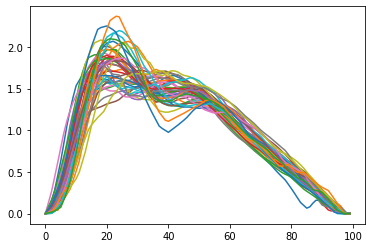

s19_trial02.avi.npy


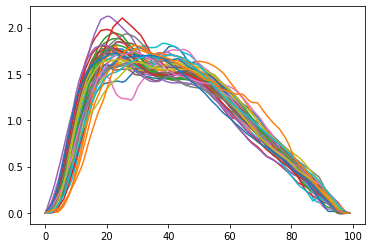

s19_trial03.avi.npy


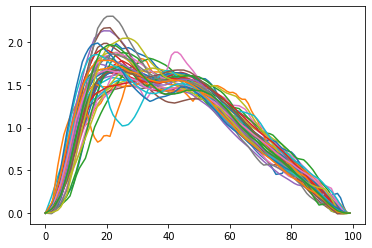

s19_trial04.avi.npy


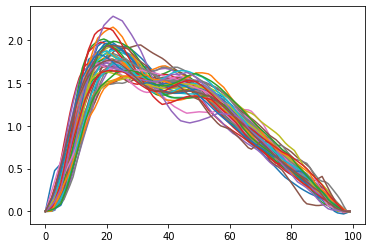

s19_trial05.avi.npy


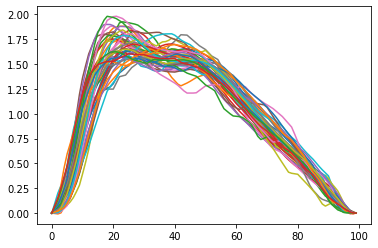

s19_trial06.avi.npy


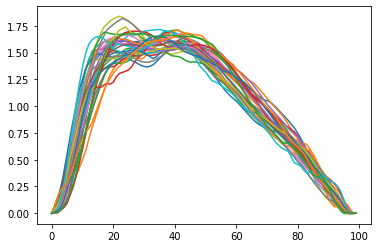

s19_trial07.avi.npy


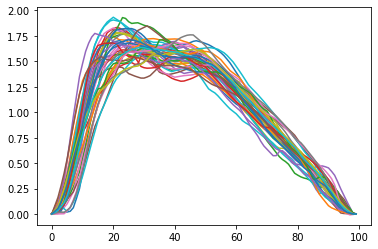

s19_trial08.avi.npy


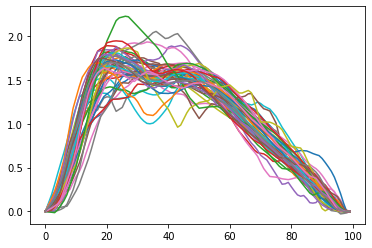

s19_trial09.avi.npy


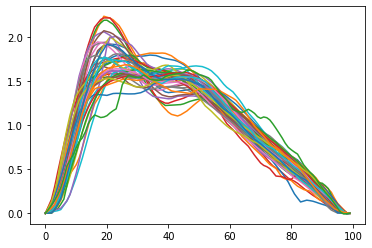

s19_trial10.avi.npy


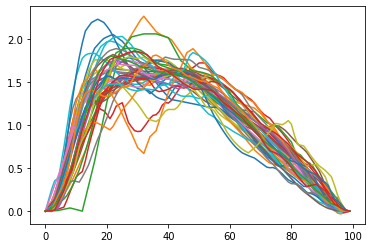

s19_trial11.avi.npy


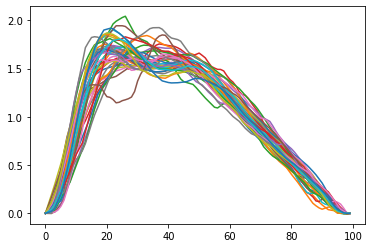

s19_trial12.avi.npy


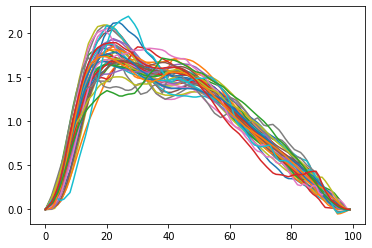

s19_trial13.avi.npy


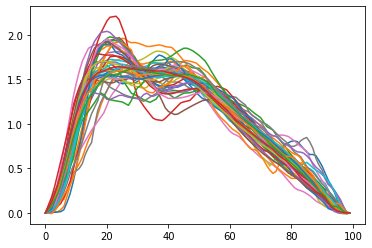

s19_trial14.avi.npy


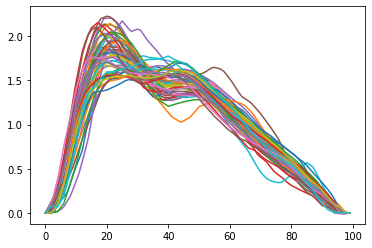

s19_trial15.avi.npy


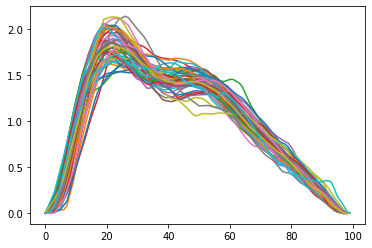

s19_trial16.avi.npy


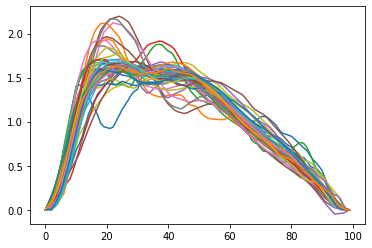

s19_trial17.avi.npy


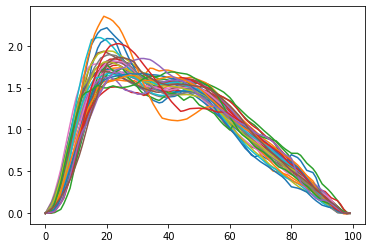

s19_trial18.avi.npy


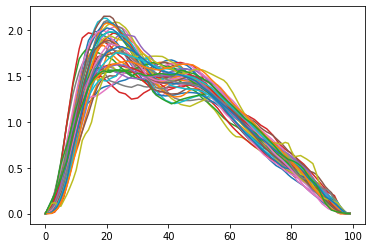

s19_trial19.avi.npy


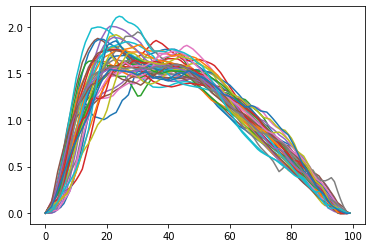

s19_trial20.avi.npy


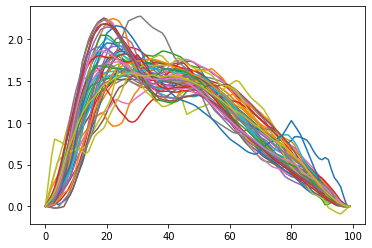

s19_trial21.avi.npy


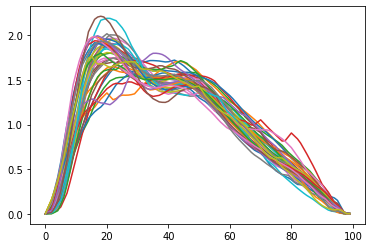

s19_trial22.avi.npy


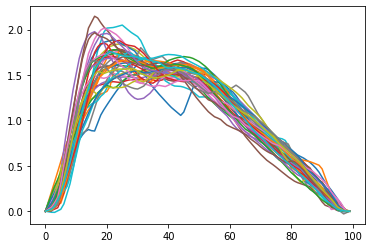

s19_trial23.avi.npy


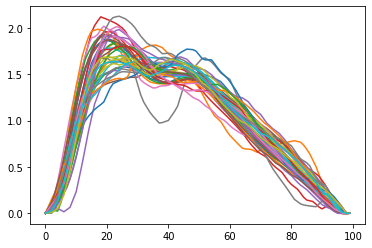

s19_trial24.avi.npy


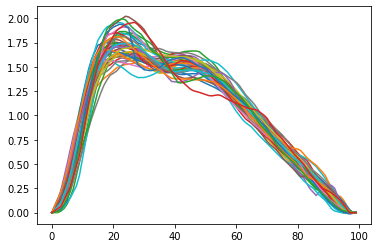

s19_trial25.avi.npy


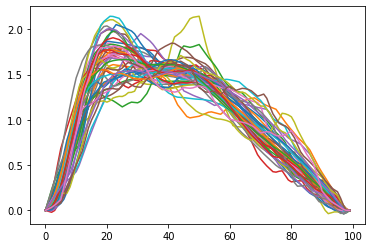

s19_trial26.avi.npy


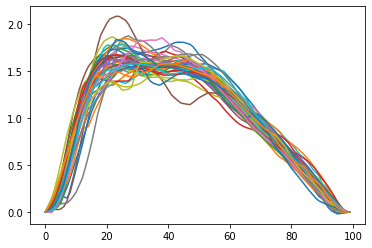

s19_trial27.avi.npy


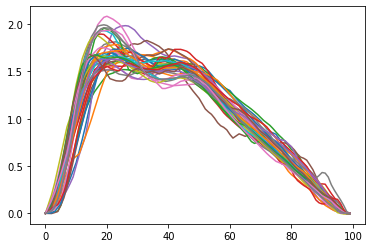

s19_trial28.avi.npy


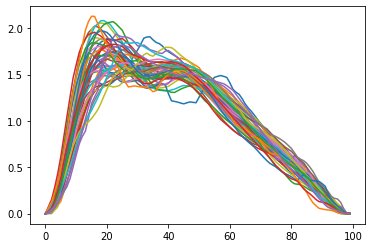

s19_trial29.avi.npy


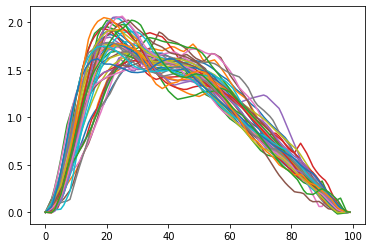

s19_trial30.avi.npy


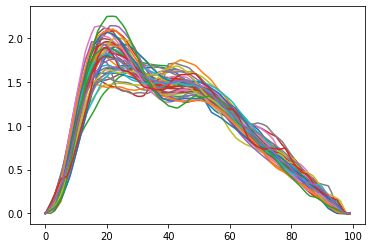

s19_trial31.avi.npy


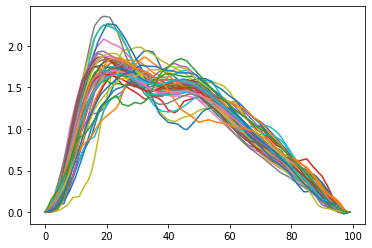

s19_trial32.avi.npy


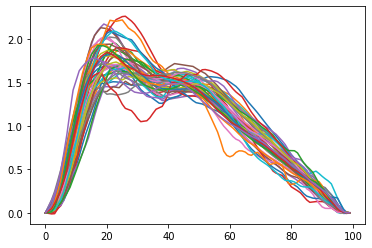

s19_trial33.avi.npy


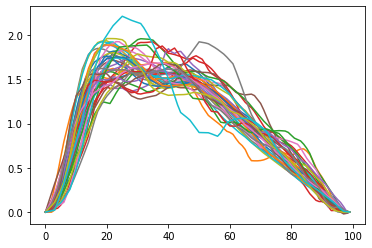

s19_trial34.avi.npy


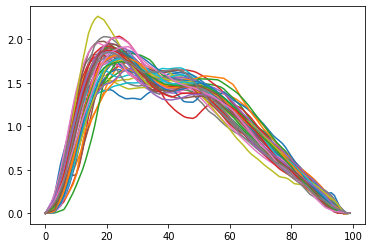

s19_trial35.avi.npy


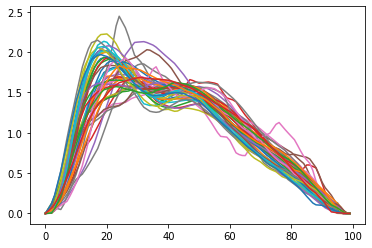

s19_trial36.avi.npy


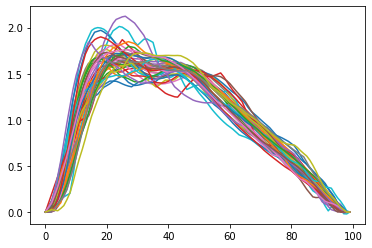

s19_trial37.avi.npy


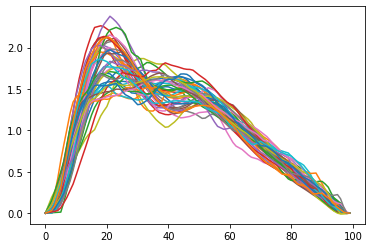

s19_trial38.avi.npy


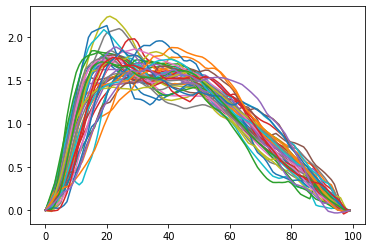

s19_trial39.avi.npy


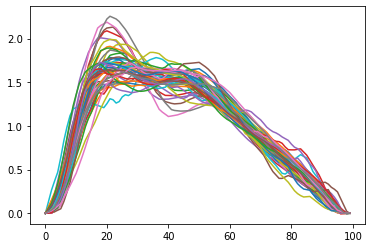

s19_trial40.avi.npy


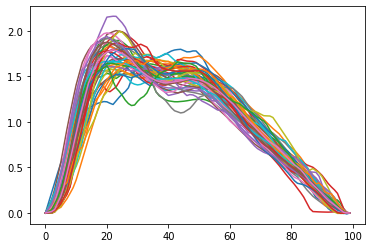

s20_trial01.avi.npy


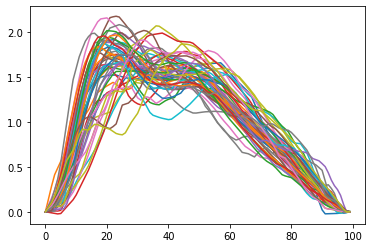

s20_trial02.avi.npy


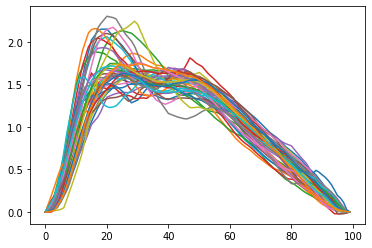

s20_trial03.avi.npy


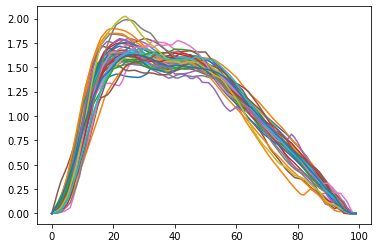

s20_trial04.avi.npy


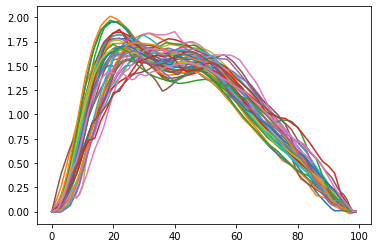

s20_trial05.avi.npy


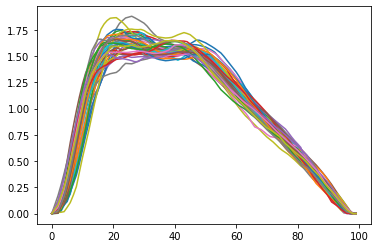

s20_trial06.avi.npy


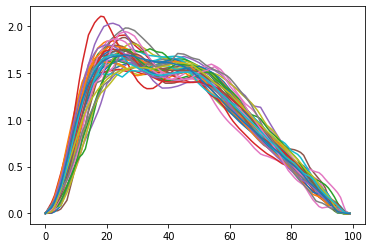

s20_trial07.avi.npy


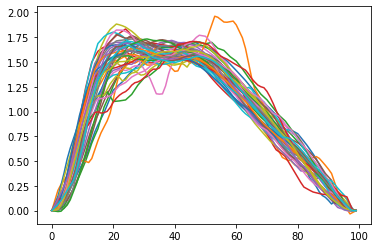

s20_trial08.avi.npy


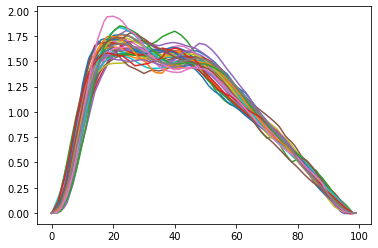

s20_trial09.avi.npy


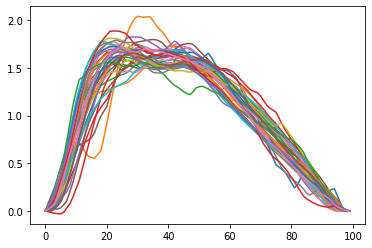

s20_trial10.avi.npy


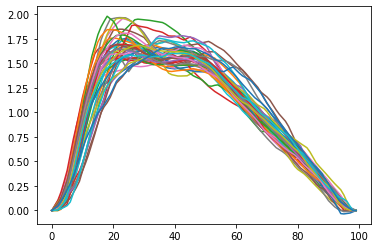

s20_trial11.avi.npy


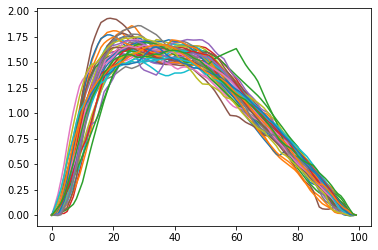

s20_trial12.avi.npy


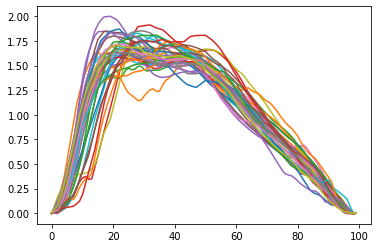

s20_trial13.avi.npy


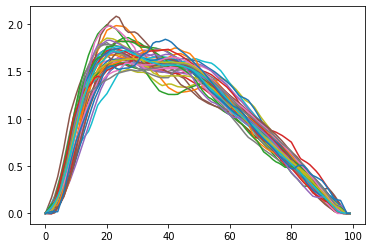

s20_trial14.avi.npy


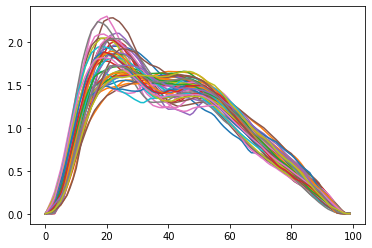

s20_trial15.avi.npy


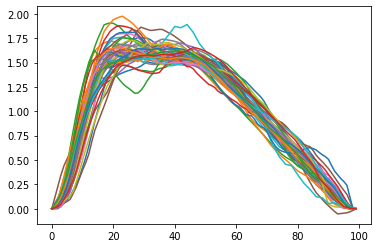

s20_trial16.avi.npy


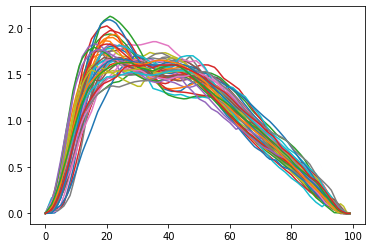

s20_trial17.avi.npy


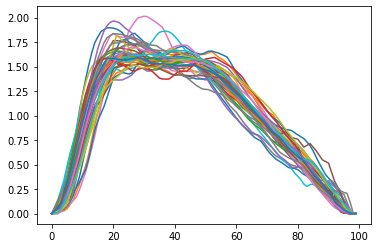

s20_trial18.avi.npy


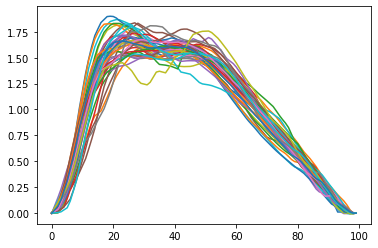

s20_trial19.avi.npy


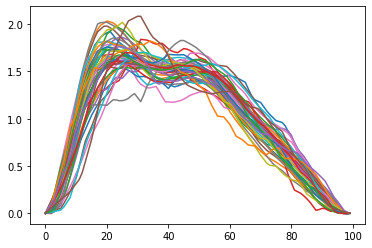

s20_trial20.avi.npy


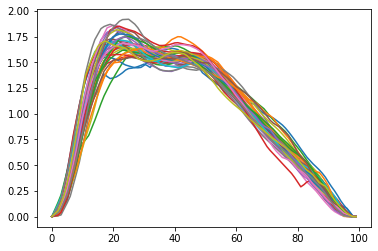

s20_trial21.avi.npy


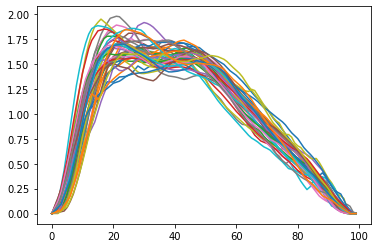

s20_trial22.avi.npy


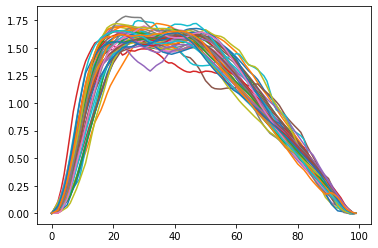

s20_trial23.avi.npy


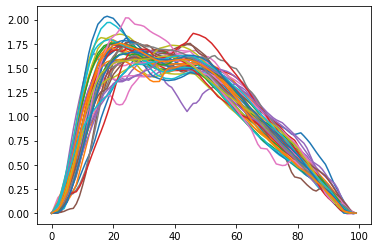

s20_trial24.avi.npy


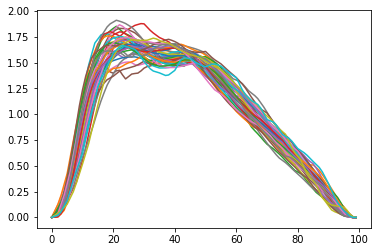

s20_trial25.avi.npy


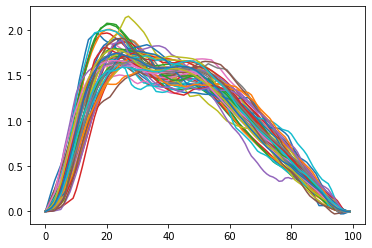

s20_trial26.avi.npy


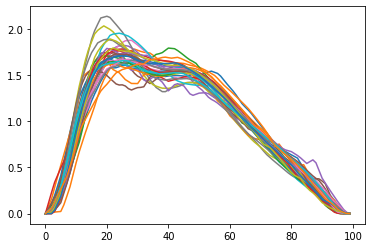

s20_trial27.avi.npy


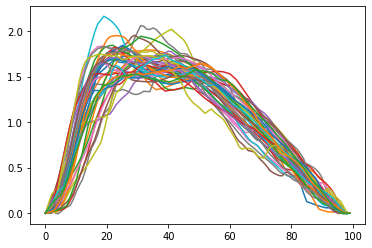

s20_trial28.avi.npy


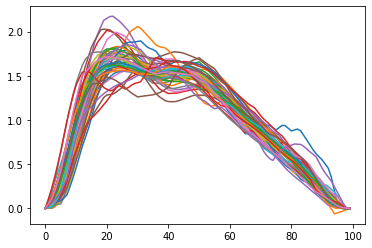

s20_trial29.avi.npy


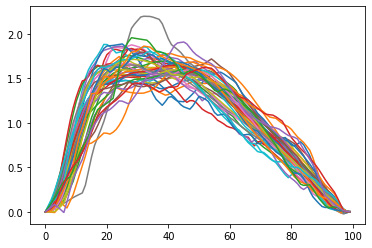

s20_trial30.avi.npy


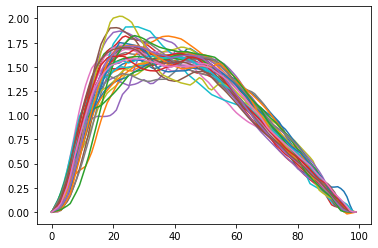

s20_trial31.avi.npy


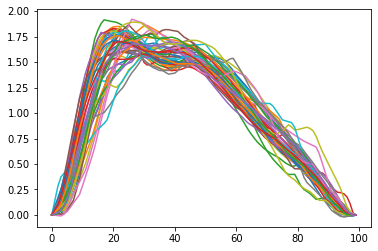

s20_trial32.avi.npy


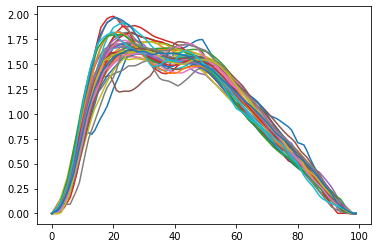

s20_trial33.avi.npy


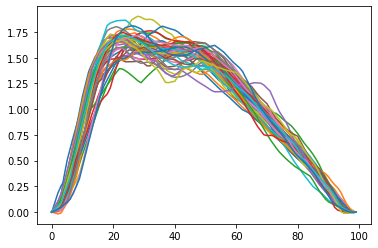

s20_trial34.avi.npy


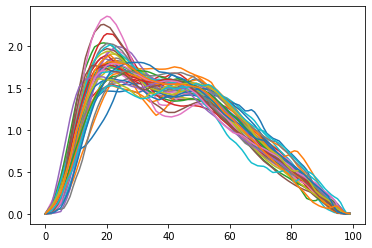

s20_trial35.avi.npy


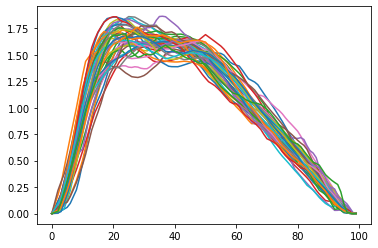

s20_trial36.avi.npy


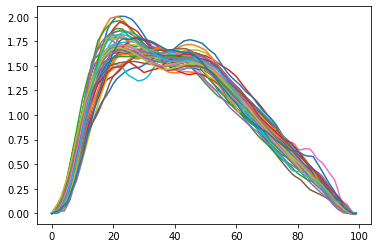

s20_trial37.avi.npy


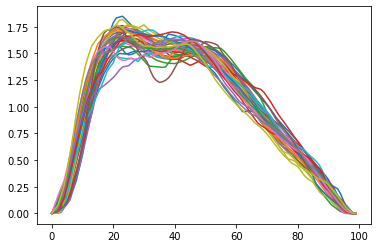

s20_trial38.avi.npy


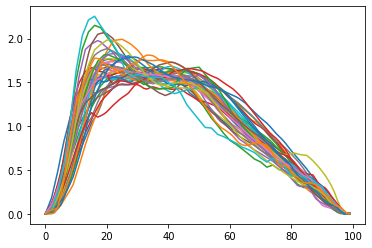

s20_trial39.avi.npy


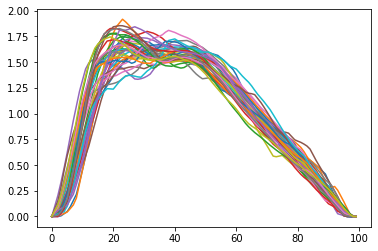

s20_trial40.avi.npy


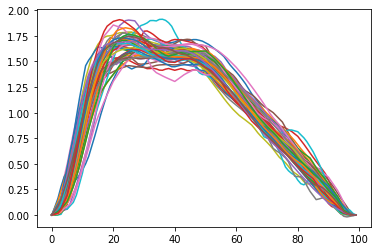

s21_trial01.avi.npy


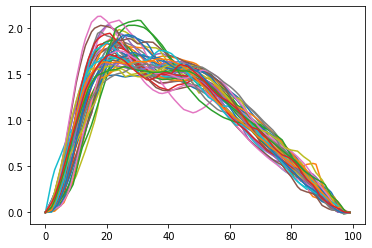

s21_trial02.avi.npy


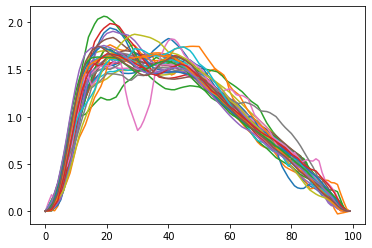

s21_trial03.avi.npy


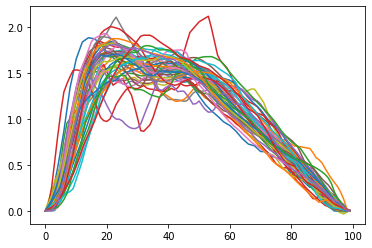

s21_trial04.avi.npy


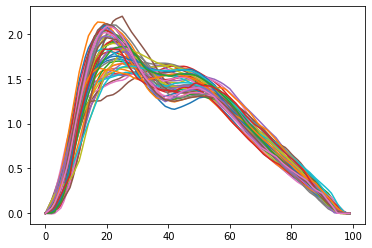

s21_trial05.avi.npy


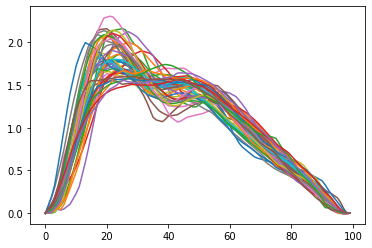

s21_trial06.avi.npy


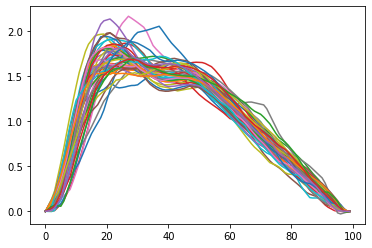

s21_trial07.avi.npy


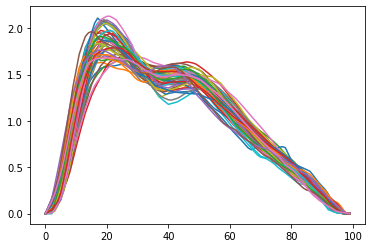

s21_trial08.avi.npy


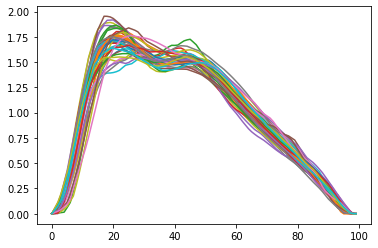

s21_trial09.avi.npy


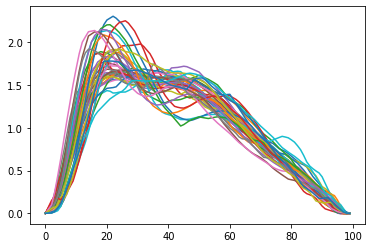

s21_trial10.avi.npy


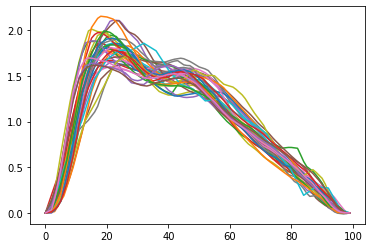

s21_trial11.avi.npy


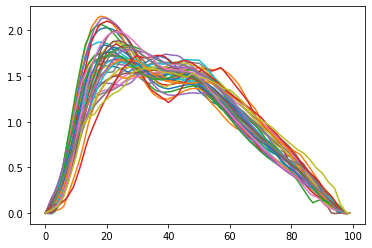

s21_trial12.avi.npy


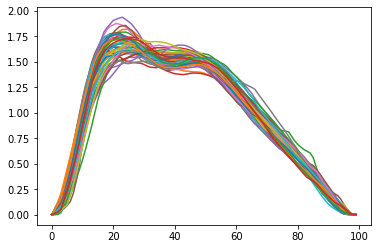

s21_trial13.avi.npy


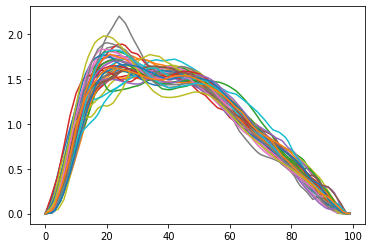

s21_trial14.avi.npy


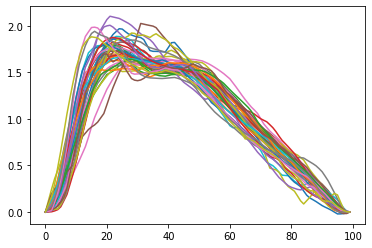

s21_trial15.avi.npy


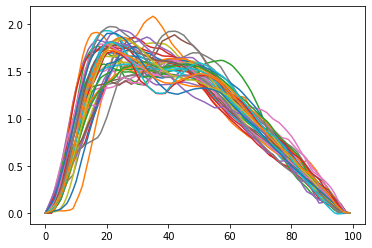

s21_trial16.avi.npy


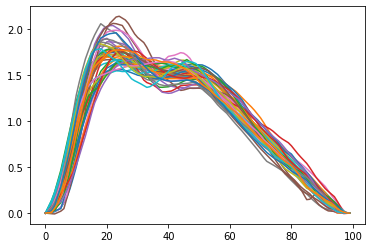

s21_trial17.avi.npy


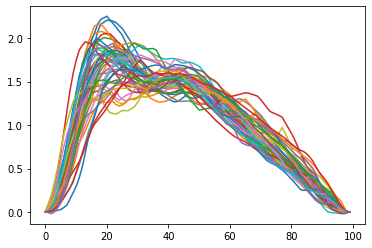

s21_trial18.avi.npy


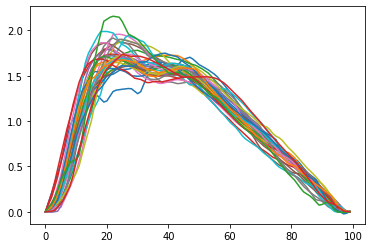

s21_trial19.avi.npy


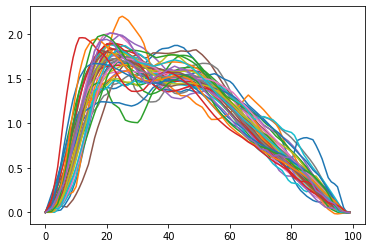

s21_trial20.avi.npy


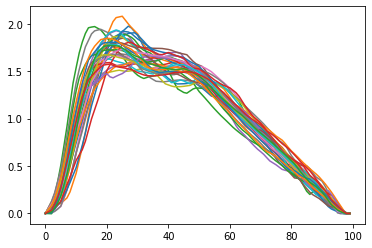

s21_trial21.avi.npy


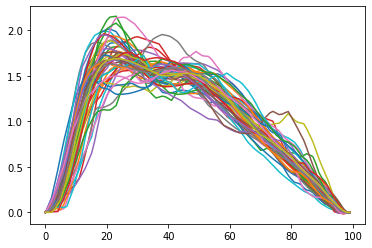

s21_trial22.avi.npy


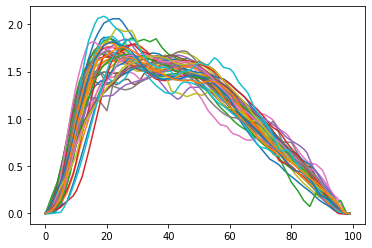

s21_trial23.avi.npy


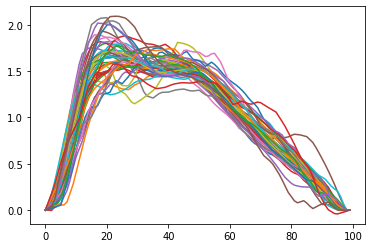

s21_trial24.avi.npy


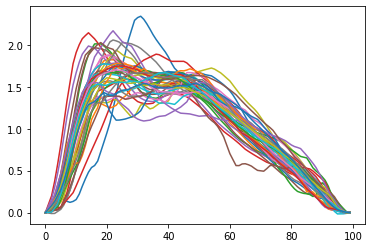

s21_trial25.avi.npy


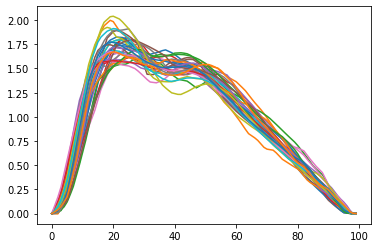

s21_trial26.avi.npy


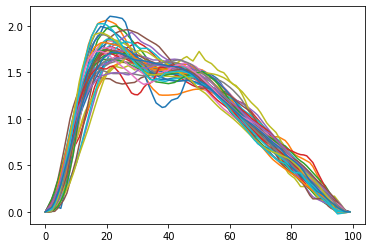

s21_trial27.avi.npy


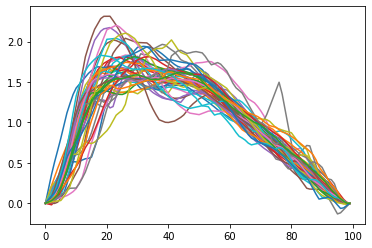

s21_trial28.avi.npy


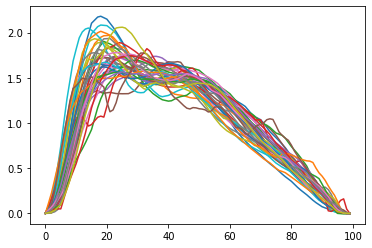

s21_trial29.avi.npy


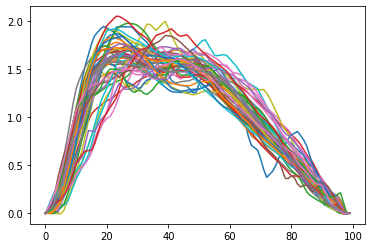

s21_trial30.avi.npy


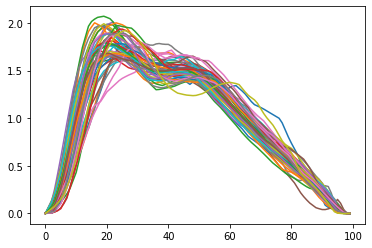

s21_trial31.avi.npy


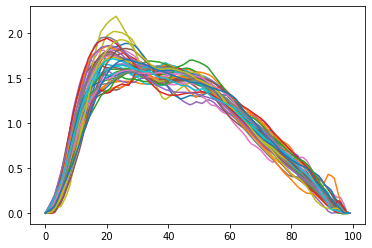

s21_trial32.avi.npy


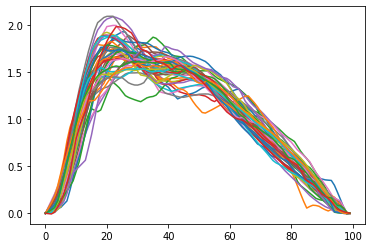

s21_trial33.avi.npy


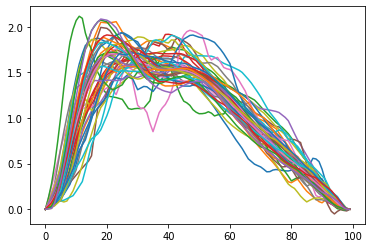

s21_trial34.avi.npy


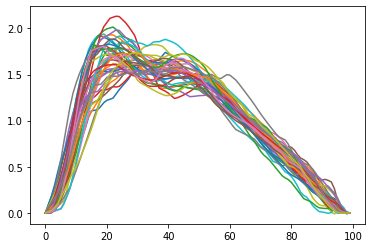

s21_trial35.avi.npy


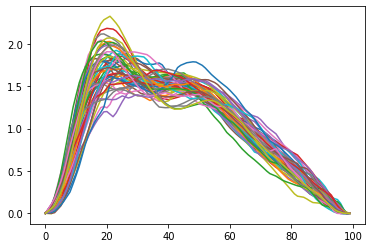

s21_trial36.avi.npy


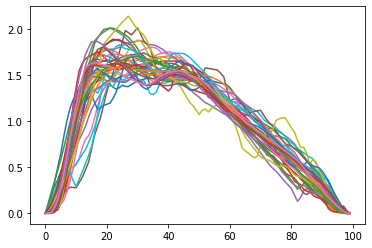

s21_trial37.avi.npy


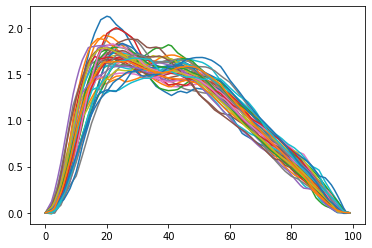

s21_trial38.avi.npy


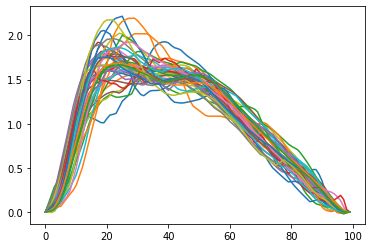

s21_trial39.avi.npy


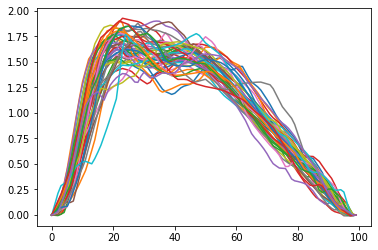

s21_trial40.avi.npy


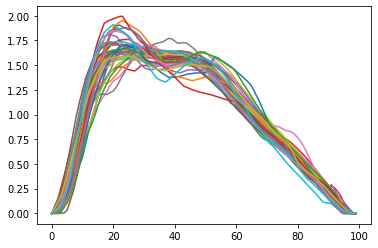

s22_trial01.avi.npy


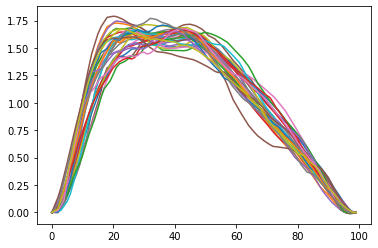

s22_trial02.avi.npy


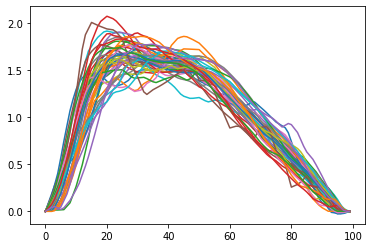

s22_trial03.avi.npy


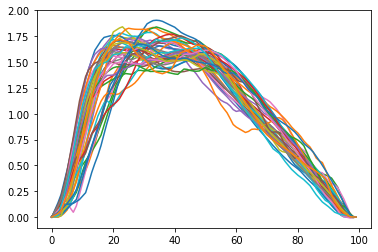

s22_trial04.avi.npy


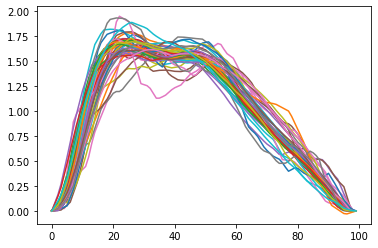

s22_trial05.avi.npy


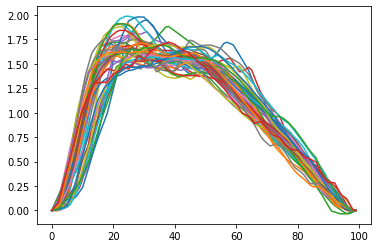

s22_trial06.avi.npy


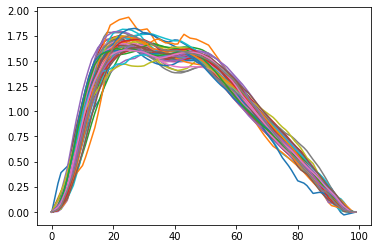

s22_trial07.avi.npy


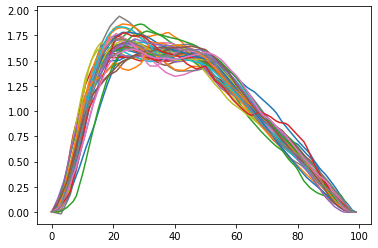

s22_trial08.avi.npy


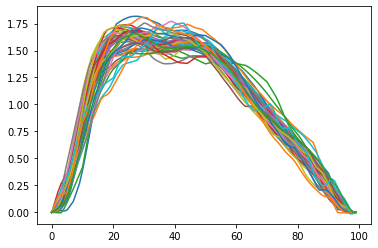

s22_trial09.avi.npy


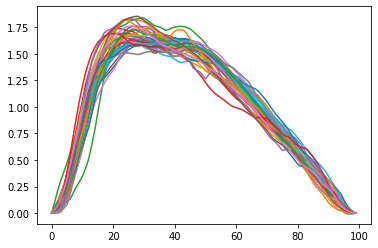

s22_trial10.avi.npy


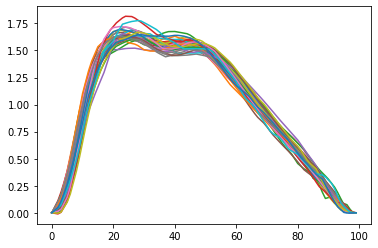

s22_trial11.avi.npy


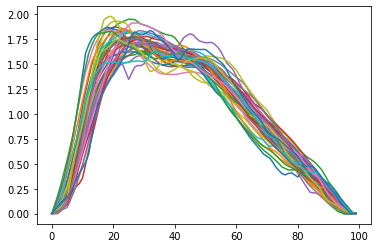

s22_trial12.avi.npy


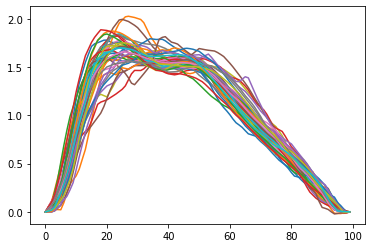

s22_trial13.avi.npy


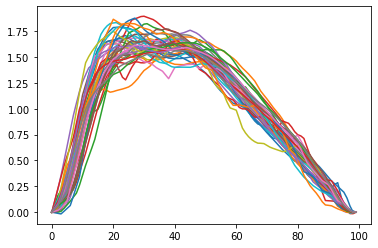

s22_trial14.avi.npy


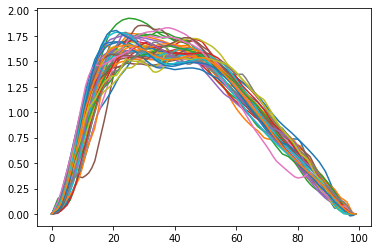

s22_trial15.avi.npy


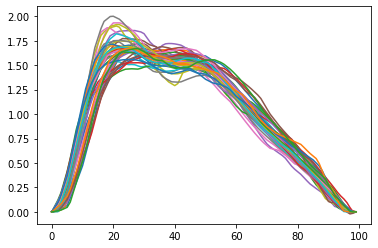

s22_trial16.avi.npy


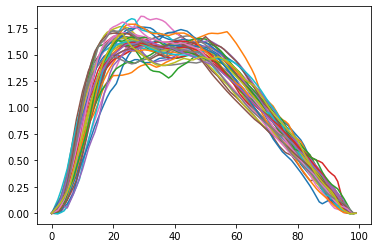

s22_trial17.avi.npy


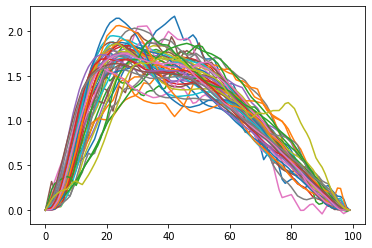

s22_trial18.avi.npy


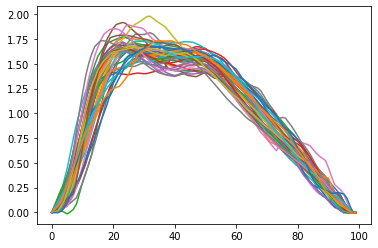

s22_trial19.avi.npy


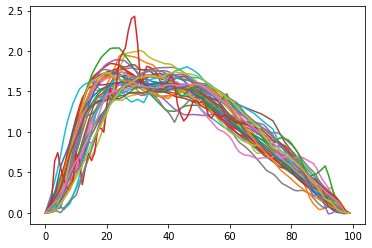

s22_trial20.avi.npy


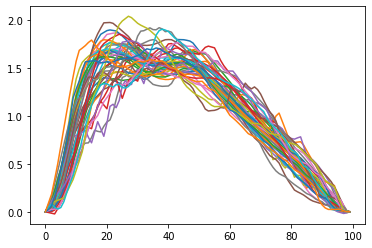

s22_trial21.avi.npy


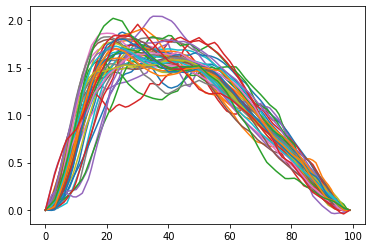

s22_trial22.avi.npy


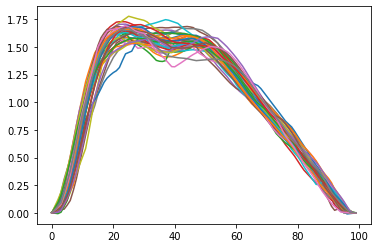

s22_trial23.avi.npy


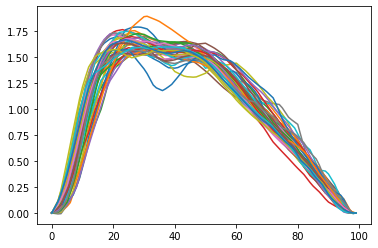

s22_trial24.avi.npy


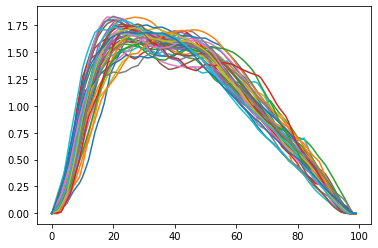

s22_trial25.avi.npy


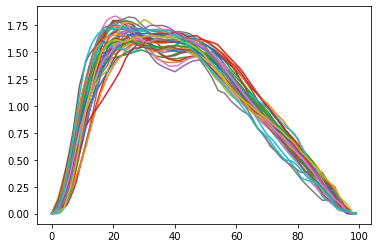

s22_trial26.avi.npy


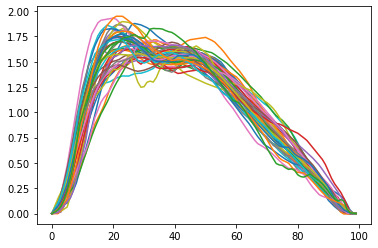

s22_trial27.avi.npy


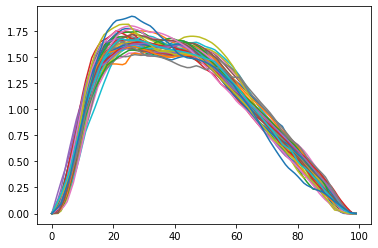

s22_trial28.avi.npy


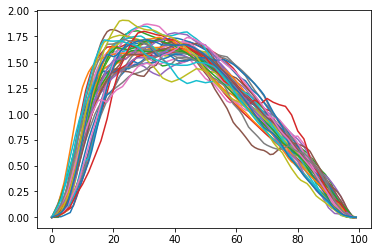

s22_trial29.avi.npy


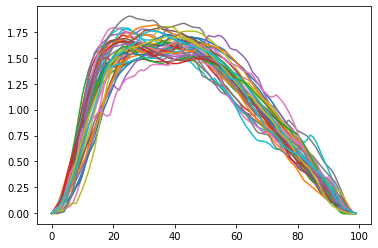

s22_trial30.avi.npy


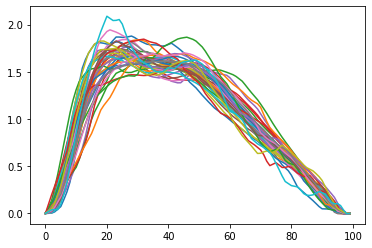

s22_trial31.avi.npy


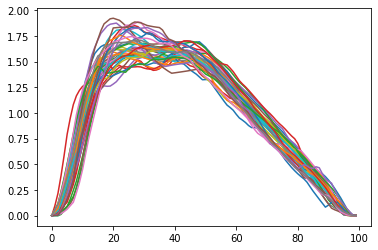

s22_trial32.avi.npy


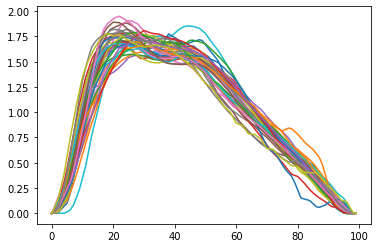

s22_trial33.avi.npy


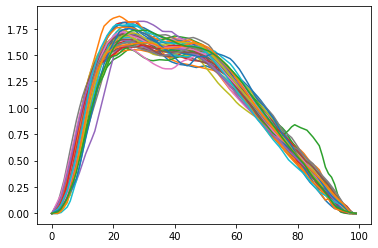

s22_trial34.avi.npy


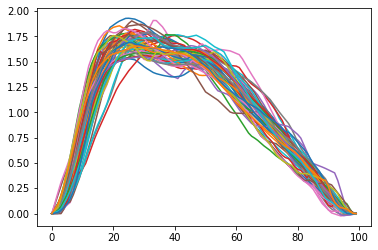

s22_trial35.avi.npy


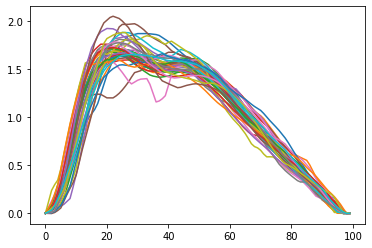

s22_trial36.avi.npy


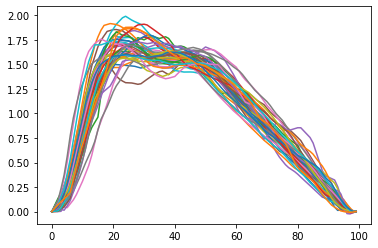

s22_trial37.avi.npy


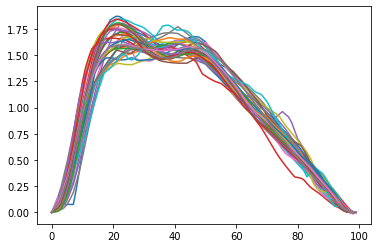

s22_trial38.avi.npy


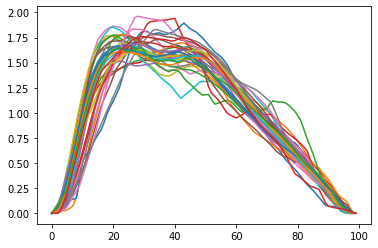

s22_trial39.avi.npy


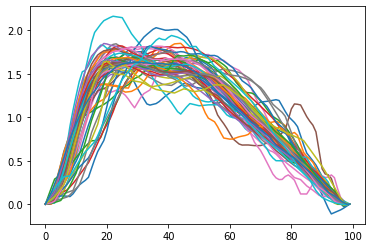

s22_trial40.avi.npy


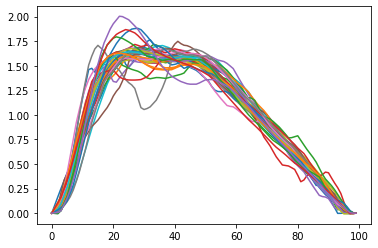

In [10]:
for key , val in k.items():
    print(key)
    plt.plot(val)
    plt.show()

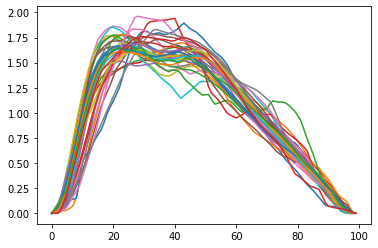

% of pulses has distance < 3.7:  0.11904761904761904


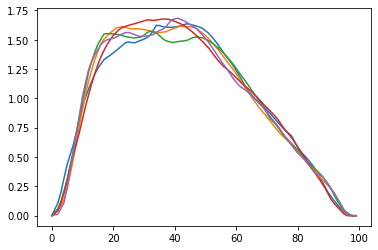

In [13]:
plt.plot(k['s22_trial38.avi.npy'])
plt.show()
plt.plot(retrivep(k['s20_trial38.avi.npy'],k['s22_trial01.avi.npy'].T,0.7))
plt.show()


In [14]:
distgram = np.zeros((160,160))

In [15]:
for i, value1 in enumerate(k.values()):
    print(i)
    for j, value2 in enumerate(k.values()):
        distgram[i,j] = np.mean(similarperson(value1.T,value2.T))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159


In [16]:
distgram[0]

array([0.80035501, 0.97759694, 0.81682527, 0.80068638, 0.99050218,
       1.29716504, 0.98387617, 0.78446313, 0.80228124, 0.68537325,
       1.02795309, 0.85610852, 0.75134768, 0.80351937, 0.9482611 ,
       0.85347216, 0.8700936 , 0.86711143, 0.88849397, 0.57958647,
       0.86549149, 0.88597498, 0.79972021, 1.18143499, 0.69313451,
       1.18717827, 0.96851836, 0.9040369 , 0.78786587, 0.94875103,
       0.73204224, 0.76557493, 0.74734895, 0.90376584, 0.73805578,
       0.94429608, 0.75218599, 0.68542339, 0.86410378, 0.82333095,
       0.63288929, 0.71909801, 1.19187717, 0.96764064, 1.50536971,
       1.06663661, 1.15684   , 1.44419209, 1.09579615, 1.09861958,
       1.13803998, 0.93422693, 1.04077313, 0.86744242, 1.12297114,
       0.87083115, 1.09179393, 1.22594505, 0.87172877, 1.30328508,
       0.95981667, 1.35236485, 0.93051431, 1.29298699, 0.87032032,
       1.08825099, 0.83873124, 0.8856842 , 0.93168749, 1.17347694,
       0.93337568, 1.27376405, 1.16357436, 0.81566017, 1.07715

In [17]:
fname = list(k.keys())

In [18]:
fname[0][1:3] == fname[17][1:3]

True

In [19]:
def auth(namel,distg,threshold):
    tp = 0
    tn = 0
    fp = 0
    fn = 0
    total = 0
    for i in range(67):
        for j in range(67):
            if namel[i][1:3] == namel[j][1:3]:
                if distg[i,j] < threshold:
                    tp = tp + 1
                else:
                    fn = fn + 1
            else:
                if distg[i,j] < threshold:
                    fp = fp + 1
                else:
                    tn = tn + 1
            total = total + 1
    #print(total)
    #print("tpr:",tp/(tp+fn))
    #print("fpr:",fp/(fp+tn))
    return np.array([tp/(tp+fn), fp/(fp+tn)])

In [20]:
auth(fname,distgram,1)

array([0.77458137, 0.67268519])

In [21]:
[i for i in np.arange(4)]

[0, 1, 2, 3]

In [22]:
rocd = np.array([ auth(fname,distgram,th) for th in np.arange(180)/100.0])

In [23]:
from sklearn.metrics import roc_curve, auc

In [24]:
auc(rocd[:,1],rocd[:,0])

0.5493600217864923

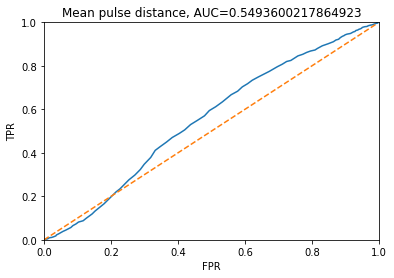

In [25]:
plt.plot(rocd[:,1],rocd[:,0])
plt.plot(np.arange(100)/100.0,np.arange(100)/100.0,linestyle='dashed')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.xlim([0,1])
plt.ylim([0,1])
plt.title("Mean pulse distance, "+ 'AUC='+str(auc(rocd[:,1],rocd[:,0])))
plt.show()

In [31]:
gt = np.load('normalized_label22_morefilt.npy')

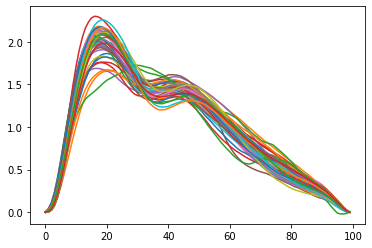

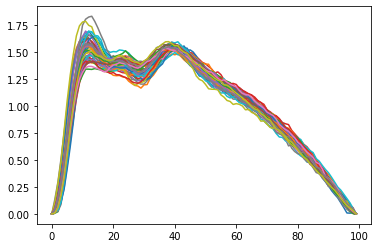

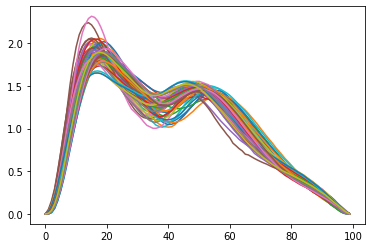

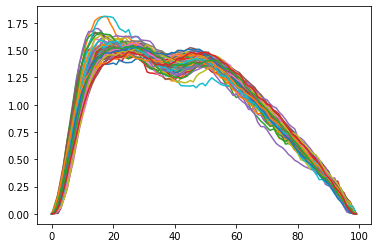

In [35]:
plt.plot(iteroutlierremove(createg(tosignature(gt[18,5,1000:-1000]),gt[18,5,1000:-1000])).T)
plt.show()
plt.plot(iteroutlierremove(createg(tosignature(gt[19,6,1000:-1000]),gt[19,6,1000:-1000])).T)
plt.show()
plt.plot(iteroutlierremove(createg(tosignature(gt[20,4,1000:-1000]),gt[20,4,1000:-1000])).T)
plt.show()
plt.plot(iteroutlierremove(createg(tosignature(gt[21,6,1000:-1000]),gt[21,6,1000:-1000])).T)
plt.show()

In [36]:
s19_sig = iteroutlierremove(createg(tosignature(gt[18,5,1000:-1000]),gt[18,5,1000:-1000]))
s20_sig = iteroutlierremove(createg(tosignature(gt[19,6,1000:-1000]),gt[19,6,1000:-1000]))
s21_sig = iteroutlierremove(createg(tosignature(gt[20,4,1000:-1000]),gt[20,4,1000:-1000]))
s22_sig = iteroutlierremove(createg(tosignature(gt[21,6,1000:-1000]),gt[21,6,1000:-1000]))

In [37]:
def tryval(s16dat,name,results,maxdist,th):    
#bins = np.arange(40)/4
    tp = 0
    tn = 0
    fp = 0
    fn = 0
    for key,val in results.items():
        #print(key)
        temp = np.array(similarperson(val.T,s16dat))
        #plt.hist(temp,bins=np.arange(20)/4)
        #plt.show()
        if key[1:3] == name:
            if np.mean(temp<maxdist) >= th:
                tp = tp + 1
            else:
                fn  = fn + 1
        else:
            if np.mean(temp<maxdist) >= th:
                fp = fp + 1
            else:
                tn  = tn + 1
        '''
        temp = np.array(similarperson(val.T,s15dat))
        if key[1:3] == '15':
            if np.mean(temp<maxdist) > th:
                tp = tp + 1
            else:
                fn  = fn + 1
        else:
            if np.mean(temp<maxdist) > th:
                fp = fp + 1
            else:
                tn  = tn + 1
                
        temp = np.array(similarperson(val.T,s17dat))
        if key[1:3] == '17':
            if np.mean(temp<maxdist) > th:
                tp = tp + 1
            else:
                fn  = fn + 1
        else:
            if np.mean(temp<maxdist) > th:
                fp = fp + 1
            else:
                tn  = tn + 1'''
        #print("<4 %:" ,np.mean(temp<4))
        #print("<4 count:" ,np.sum(temp<4))
        #plt.hist(temp,bins=bins)
        #plt.show()
    return np.array([tp/(tp+fn), fp/(fp+tn)])

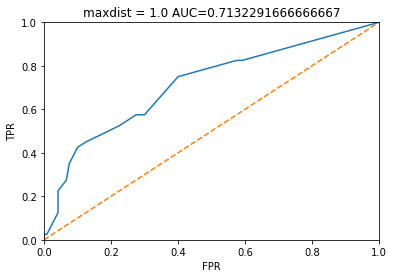

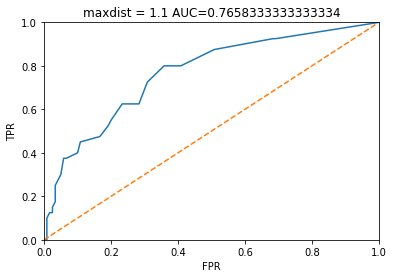

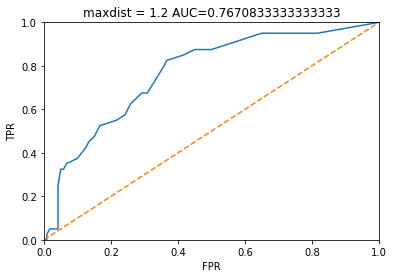

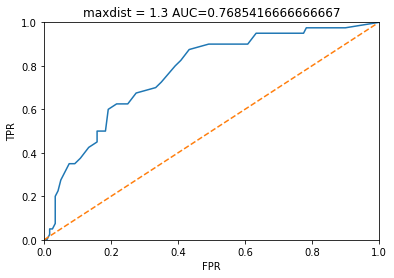

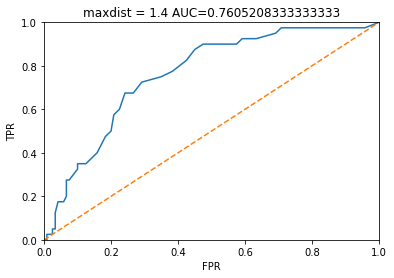

...

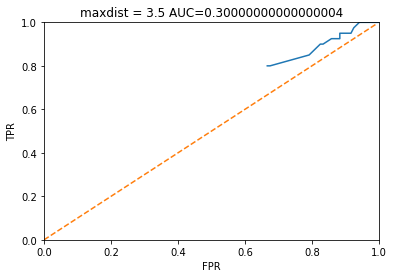

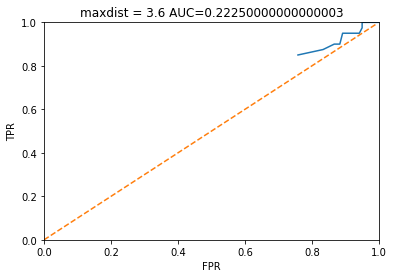

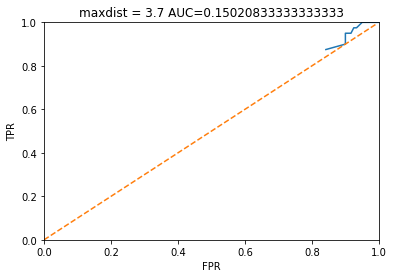

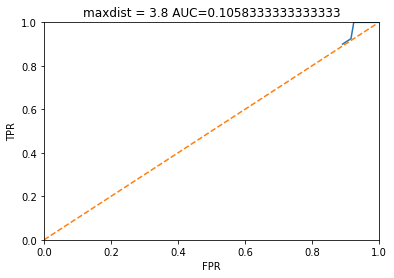

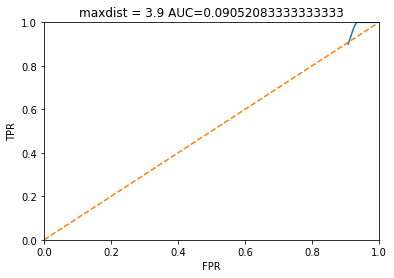

In [46]:
for i in range(30):
    maxd = 1.0+i/10.0
    rocd = np.array([ tryval(s19_sig,'19',k,maxd, th) for th in np.arange(100)/99.0])
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.plot(rocd[:,1],rocd[:,0])
    plt.plot(np.arange(100)/100.0,np.arange(100)/100.0,linestyle='dashed')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.title("maxdist = "+str(maxd) + ' AUC='+str(auc(rocd[:,1],rocd[:,0])))
    plt.show()